# Image Compression Using Principal Component Analysis.


## Learning Outcomes
Learning outcomes can be following but not limited to:
1. Understand and use the image manipulation library within python.,
2. Better understand the real world example on the use of Eigen Decomposition,
3. Learn to present your work in a professional and academic manner,
4. Learn to build a project in group.

# Tasks

## A. Load and Prepare the data
Pick an color image of your choice and do the following.
1. Load the image using image reading library, you can use Pillow or matplotlib or any other library of your
confidence.
2. For the simplicity, convert the image into gray scale i.e. black and white.

In [ ]:
#Necessary Inputs
#Importing numpy to use array, lists related operations in an easy-use way
import numpy as np
#Importing pandas an open source data analysis library built on top of the Python programming language
import pandas as pd
#Importing matplotlib.pyplot i.e. collection of command style functions that make matplotlib work
import matplotlib.pyplot as plt

In [ ]:
#By using the Google Drive file ID, we can import a single file, e.g., csv or txt file, from Google Drive.
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


* PIL is the Python Imaging Library which provides the python interpreter with image editing capabilities.

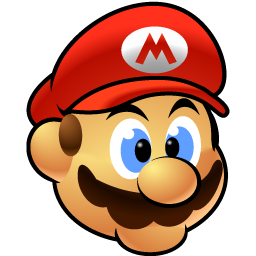

In [ ]:
#Using PIL library to import Image
from PIL import Image
#Initializing a variable myImage that opens the image from it's path 
myImage = Image.open("/content/drive/MyDrive/AI_Coursework/mario.png");
#Initializng another variable that stores the image in Numpy array
imageArray = np.array(myImage) 
#Displays the image in the termainal
myImage

* The operation below displays the basic data of the image.

In [ ]:
#Shows the details of image like image format, mode, size 
myImage.show

<bound method Image.show of <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=256x256 at 0x7F0B895466A0>>

* The below operation is performed to check the details of the image that we have extracted from the Google Drive. This particular operation shows the image format, mode, pixel type, image size etc.

In [ ]:
#Displays image format i.e. png, jpg, svg etc.
print('Image Format',myImage.format)
#Displays image mode i.e. RBGA or CMYK
print('Image mode:', myImage.mode)
#Displays the datatype of the pixel
print('Pixel type:', imageArray.dtype) 
#Displays the dimension of image [Dimension-1 for Gray Scale image, Dimension-3 for RGB image]
print('Number of dimensions:', imageArray.ndim) 
#Displays the size of the array
print('Image size:', imageArray.shape)
#Displays the total size of image in an array
print('Image total size:',imageArray.size)

Image Format PNG
Image mode: RGBA
Pixel type: uint8
Number of dimensions: 3
Image size: (256, 256, 4)
Image total size: 262144


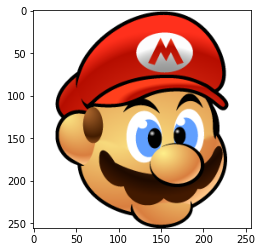

In [ ]:
#Checking the pixel scaling is correct or not 
plt.imshow(imageArray)

* Since the image consist of RBG values, for simplicity, converting the image into gray scale i.e. black and white, this will help us in further operation to find the value for variance, covariance, eigen value, eigen vectors and so on. To conver the image, .convert('L') transforms the image in grayscale and then the image is trasformed into array to extract the data set.

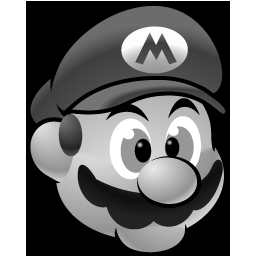

In [ ]:
#Initializing a variable imageGray and then converting the image into grayscale
imageGray = myImage.convert('L')
#Initializing another variable that stores the array of the grayscale image 
imageGrayArray = np.array(imageGray)
#To return an image from an array of pixels
pilImage = Image.fromarray(imageGrayArray)
#Saving the image
pilImage.save('GrayMario.png')
#Displays the image in the terminal 
imageGray


## B. Standardize/Scale the data
To assure all the initial variables are transformed to same scale, it is a most to perform scaling operation before
any PCA operation. For the same purpose, we will perform standardization of data, which satisfies the following
expression:

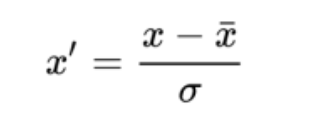

* In the operarion below, the numpy asarray() function is used which converts an input to an array. Whether the input is a list, lists of tuples, tuples, tuples of tuples, tuples of lists, and ndarrays, this is the function of the numpy module present in the standard library of python.

In [ ]:
#Importing asarray function from numpy library 
from numpy import asarray
#Initialzing a varibale that stores the array form of data of the image
ImageInArray = asarray(pilImage)
#Displays the array of the image
ImageInArray

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

* To assure the variance of the data of the image, first we need to find the mean and standard deviation of the value of array of that image. Then, after getting the values, it should be implemented to the variance formula to interpet the value of standardize value.

In [ ]:
#Initializing ImageMean variable that stores the mean of the array of image
ImageMean =  ImageInArray.mean()
#Initializing ImageStd variable that stores the standard deviation of the array of image
ImageStd = ImageInArray.std()
#Displays the image mean and standard deviation
print('Mean: \n',ImageMean)
print('Standard Deviation: \n',ImageStd)
#Operation for variance of the image using formula
ImageVariance = (ImageInArray-ImageMean)/ImageStd
#Displays the variance of the image data 
print("Standarize Value (Varinace): \n", ImageVariance)


Mean: 
 119.67254638671875
Standard Deviation: 
 100.96241006703069
Standarize Value (Varinace): 
 [[1.34037464 1.34037464 1.34037464 ... 1.34037464 1.34037464 1.34037464]
 [1.34037464 1.34037464 1.34037464 ... 1.34037464 1.34037464 1.34037464]
 [1.34037464 1.34037464 1.34037464 ... 1.34037464 1.34037464 1.34037464]
 ...
 [1.34037464 1.34037464 1.34037464 ... 1.34037464 1.34037464 1.34037464]
 [1.34037464 1.34037464 1.34037464 ... 1.34037464 1.34037464 1.34037464]
 [1.34037464 1.34037464 1.34037464 ... 1.34037464 1.34037464 1.34037464]]


In [ ]:
#Creating dataframe from the covariance matrix for visualization
datafVar = pd.DataFrame(ImageVariance)
#Styling the dataframe
datafVar.style.background_gradient(cmap='RdYlGn')


## C. Calculate Covariance Matrix
Each element of the covariance matrix represents covariance between each ijth element. The covariance between
two elements is calculated and stored in the matrix as shown in picture below:

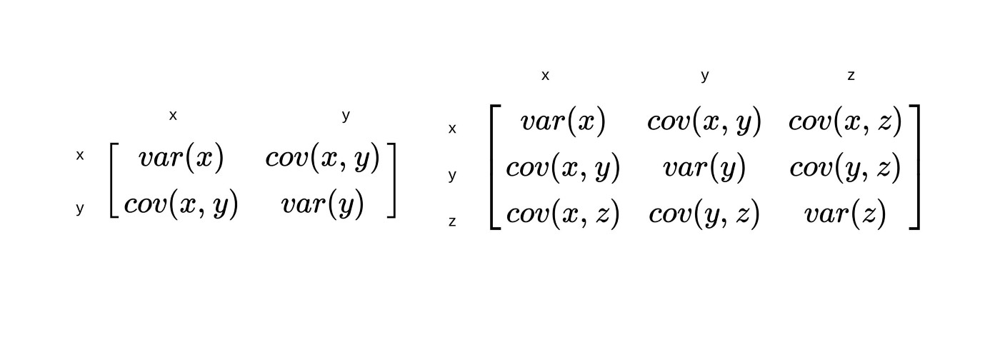

* The below operation, finds the covariance of the image data using numpy.cov which is a funtion of numpy library.

In [ ]:
#Operation for finding the covariance of the data inside that image
ImageCovariance = np.cov(ImageVariance)
#Displays the covariance of the image
print(ImageCovariance)

[[1.97988619e-31 1.59318967e-31 1.59318967e-31 ... 1.59318967e-31
  1.59318967e-31 1.59318967e-31]
 [1.59318967e-31 1.03660741e+00 1.03660741e+00 ... 1.03660741e+00
  1.03660741e+00 1.03660741e+00]
 [1.59318967e-31 1.03660741e+00 1.03660741e+00 ... 1.03660741e+00
  1.03660741e+00 1.03660741e+00]
 ...
 [1.59318967e-31 1.03660741e+00 1.03660741e+00 ... 1.03660741e+00
  1.03660741e+00 1.03660741e+00]
 [1.59318967e-31 1.03660741e+00 1.03660741e+00 ... 1.03660741e+00
  1.03660741e+00 1.03660741e+00]
 [1.59318967e-31 1.03660741e+00 1.03660741e+00 ... 1.03660741e+00
  1.03660741e+00 1.03660741e+00]]


* To visulaize the covariance of the image this dataframe is shown.

In [ ]:
#Creating dataframe from the covariance matrix for visualization
dataf = pd.DataFrame(ImageCovariance)
#Styling the dataframe
dataf.style.background_gradient(cmap='RdYlGn')

## D. Eigen Decomposition
Decompose a covariance matrix into eigen values and eigen vectors:
A(n*n)= PDP^I

Where:
1. A(n*n): −Covariance Matrix.
2. P:- Eigen Vector of Covariance Matrix.
3. D:- Diagonal Matrix. Diagonal elements are Eigen Values.
4. P^I
: −Inverse of Eigen Vector.

* To start with finding the eigen decomposition, we first need is to get the covariance of the matrix which is also the covarinace of the image operated above. Now, the eigen value and eigen vectors of the covariance matrix is defined using fucntions and then displaying the output.

In [ ]:
#Initializing the value for the variable
CovarianceMatrix =  ImageCovariance
#Operation for eigen values and eigen vectors of the covariance matrix
eigenValue, eigenVector = np.linalg.eig(CovarianceMatrix)
#Prints the eigen values
print("Eigenvalues", eigenValue)

Eigenvalues [ 1.53284000e+02+0.00000000e+00j  1.90707948e+01+0.00000000e+00j
  1.46202786e+01+0.00000000e+00j  6.57079687e+00+0.00000000e+00j
  5.69431638e+00+0.00000000e+00j  3.86146864e+00+0.00000000e+00j
  3.03133547e+00+0.00000000e+00j  2.74165039e+00+0.00000000e+00j
  2.05774496e+00+0.00000000e+00j  1.83060925e+00+0.00000000e+00j
  1.53680074e+00+0.00000000e+00j  1.15912824e+00+0.00000000e+00j
  9.20899976e-01+0.00000000e+00j  7.86413344e-01+0.00000000e+00j
  6.97247344e-01+0.00000000e+00j  5.68681145e-01+0.00000000e+00j
  5.07592171e-01+0.00000000e+00j  4.17643290e-01+0.00000000e+00j
  4.00037987e-01+0.00000000e+00j  3.94649689e-01+0.00000000e+00j
  3.29952786e-01+0.00000000e+00j  3.09460236e-01+0.00000000e+00j
  2.98078351e-01+0.00000000e+00j  2.80575709e-01+0.00000000e+00j
  2.59536702e-01+0.00000000e+00j  2.25565218e-01+0.00000000e+00j
  2.00045871e-01+0.00000000e+00j  1.89193408e-01+0.00000000e+00j
  1.81570408e-01+0.00000000e+00j  1.71384199e-01+0.00000000e+00j
  1.54278901e

In [ ]:
#Displays the eigen vector values
print("Eigenvectors as columns", eigenVector)

Eigenvectors as columns [[-4.75958715e-16+0.00000000e+00j  2.61874137e-16+0.00000000e+00j
   1.77350251e-16+0.00000000e+00j ...  8.31287571e-05+1.78938242e-04j
  -4.75361356e-05+5.23726156e-05j -4.75361356e-05-5.23726156e-05j]
 [ 7.37646445e-02+0.00000000e+00j  4.46756018e-02+0.00000000e+00j
  -8.44258607e-02+0.00000000e+00j ... -4.76904939e-01-0.00000000e+00j
   9.26460099e-02-2.52792122e-02j  9.26460099e-02+2.52792122e-02j]
 [ 7.37646445e-02+0.00000000e+00j  4.46756018e-02+0.00000000e+00j
  -8.44258607e-02+0.00000000e+00j ...  8.93898567e-03+1.67464740e-03j
  -4.81911993e-03-1.02530567e-02j -4.81911993e-03+1.02530567e-02j]
 ...
 [ 7.37646445e-02+0.00000000e+00j  4.46756018e-02+0.00000000e+00j
  -8.44258607e-02+0.00000000e+00j ...  1.86084840e-01-4.96563838e-02j
  -3.54775277e-02-3.00484265e-01j -3.54775277e-02+3.00484265e-01j]
 [ 7.37646445e-02+0.00000000e+00j  4.46756018e-02+0.00000000e+00j
  -8.44258607e-02+0.00000000e+00j ...  2.13760134e-01-3.84821354e-02j
   4.39489696e-01+0.000

In [ ]:
indices = np.argsort(eigenValue)[::-1]
vec = eigenVector[:, indices]

In [ ]:
# Making list of (eigenvalue, eigenvector) tuples
eigenPairs = [(np.abs(eigenValue[i]), eigenVector[:,i]) for i in range(len(eigenValue))]
#Sorting the (eigenvalue, eigenvector) tuples from high to low
sortedEigen = sorted(eigenPairs, key=lambda x: x[0], reverse=True)
#Declaring an empty list
lista=[]
#Displaying the sorted value by decreasing eigenvalues
print('Eigenvalues in descending order:')
#For loop that iterates through eigen values and eigen vectors
for i in eigenPairs:
  #Taking the first element of the tuples
  sortedEigenValues = i[0]
  #Joins the sorted values in the list
  lista.append(sortedEigenValues)
  #Displays the sorted eigen values 
  print(sortedEigenValues)


Eigenvalues in descending order:
153.2839996934812
19.070794775611894
14.620278590443604
6.570796866790922
5.694316382400771
3.861468639235661
3.0313354734442592
2.741650392881772
2.057744963101674
1.830609245776723
1.5368007416722949
1.1591282432713597
0.9208999762117308
0.7864133442011279
0.6972473438263127
0.568681144909416
0.5075921711718062
0.4176432904885719
0.40003798749622543
0.3946496892516222
0.3299527863911953
0.30946023627070857
0.29807835070589067
0.2805757091566327
0.25953670246351473
0.22556521844949623
0.20004587095407203
0.1891934082368341
0.1815704082930339
0.17138419909864477
0.15427890109382597
0.14772374657487894
0.1401605551682933
0.1151130587780241
0.11072086834879752
0.10947075416233507
0.10518368050823423
0.09363986229998157
0.08995181204009228
0.0865379446237818
0.08099611745681318
0.07593679284552597
0.07178782388943591
0.07014321769015032
0.0646758661920792
0.06009714107201565
0.05724200684268799
0.05516261251506284
0.050921682950059055
0.04787647977953747
0

## E. Identify Principal Components
Determine the explained variance by each principal components, based on this we can determine how
many principal components to pick from.
* Experiment with Principal Components:


– Pick three different combination of principal components with various explained variance
value and compare the result.

In [ ]:
#Initializing a varibale that gives the sum of the eigen values
totalEigenValue = np.sum(eigenValue)
#Operation to find the explained variance in a loop 
expVariance = [(i /totalEigenValue)*100 for i in sorted(eigenValue, reverse=True)]
#Finding and storing the cumulative explained variance 
cumVarianceExp = np.cumsum(expVariance)
#Displays the explained variance
print('Explained Variance: ')
expVariance

Explained Variance: 


[(67.95366589647418+7.426418381166663e-32j),
 (8.454440249168869+9.239561933944266e-33j),
 (6.481443129322456+7.083342415318336e-33j),
 (2.9129572287543763+3.183469033169002e-33j),
 (2.5243970259926454+2.758825182993837e-33j),
 (1.7118613182396765+1.8708333379911074e-33j),
 (1.3438477492398173+1.4686441849433533e-33j),
 (1.2154249313390548+1.3282953806753964e-33j),
 (0.912236854481756+9.96951739796054e-34j),
 (0.8115433399654322+8.869073209699168e-34j),
 (0.6812925312353658+7.445607694846088e-34j),
 (0.5138632442520926+5.615831599627768e-34j),
 (0.40825219483246755+4.4616453930159195e-34j),
 (0.34863175383754713+3.8100744541169313e-34j),
 (0.3091027970585523+3.378076316357741e-34j),
 (0.252106994859701+2.75518913652003e-34j),
 (0.22502510947293441+2.4592206868718002e-34j),
 (0.18514908720098774+2.023429591775691e-34j),
 (0.1773443268871884+1.9381340971318816e-34j),
 (0.174955593429055+1.9120284649674366e-34j),
 (0.14627424553687146+1.5985800492371538e-34j),
 (0.13718951453403394+1.4992

In [ ]:
#Displaying the cumulative explained variance
cumVarianceExp

array([ 67.9536659 +0.00000000e+00j,  76.40810615+0.00000000e+00j,
        82.88954927+0.00000000e+00j,  85.8025065 +0.00000000e+00j,
        88.32690353+0.00000000e+00j,  90.03876485+0.00000000e+00j,
        91.3826126 +0.00000000e+00j,  92.59803753+0.00000000e+00j,
        93.51027438+0.00000000e+00j,  94.32181772+0.00000000e+00j,
        95.00311025+0.00000000e+00j,  95.5169735 +0.00000000e+00j,
        95.92522569+0.00000000e+00j,  96.27385745+0.00000000e+00j,
        96.58296024+0.00000000e+00j,  96.83506724+0.00000000e+00j,
        97.06009235+0.00000000e+00j,  97.24524144+0.00000000e+00j,
        97.42258576+0.00000000e+00j,  97.59754136+0.00000000e+00j,
        97.7438156 +0.00000000e+00j,  97.88100512+0.00000000e+00j,
        98.01314883+0.00000000e+00j,  98.13753329+0.00000000e+00j,
        98.25259077+0.00000000e+00j,  98.35258805+0.00000000e+00j,
        98.44127213+0.00000000e+00j,  98.52514511+0.00000000e+00j,
        98.60563867+0.00000000e+00j,  98.68161649+0.00000000e+

In [ ]:
#Maing a list of (eigenvalue, eigenvector) tuples
eigenPair = [(np.abs(eigenValue[i]), eigenVector[:,i]) for i in range(len(eigenValue))]
# Sort the (eigenvalue, eigenvector) tuples from high to low
eigenPair.sort(key=lambda x: x[0], reverse=True)
# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigen Pairs in descending order:')
#Prints the eigen pair value in a for loop interation 
for i in eigenPairs:
    print(i[0])

Eigen Pairs in descending order:
153.2839996934812
19.070794775611894
14.620278590443604
6.570796866790922
5.694316382400771
3.861468639235661
3.0313354734442592
2.741650392881772
2.057744963101674
1.830609245776723
1.5368007416722949
1.1591282432713597
0.9208999762117308
0.7864133442011279
0.6972473438263127
0.568681144909416
0.5075921711718062
0.4176432904885719
0.40003798749622543
0.3946496892516222
0.3299527863911953
0.30946023627070857
0.29807835070589067
0.2805757091566327
0.25953670246351473
0.22556521844949623
0.20004587095407203
0.1891934082368341
0.1815704082930339
0.17138419909864477
0.15427890109382597
0.14772374657487894
0.1401605551682933
0.1151130587780241
0.11072086834879752
0.10947075416233507
0.10518368050823423
0.09363986229998157
0.08995181204009228
0.0865379446237818
0.08099611745681318
0.07593679284552597
0.07178782388943591
0.07014321769015032
0.0646758661920792
0.06009714107201565
0.05724200684268799
0.05516261251506284
0.050921682950059055
0.04787647977953747
0

/usr/local/lib/python3.8/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)
/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.8/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)


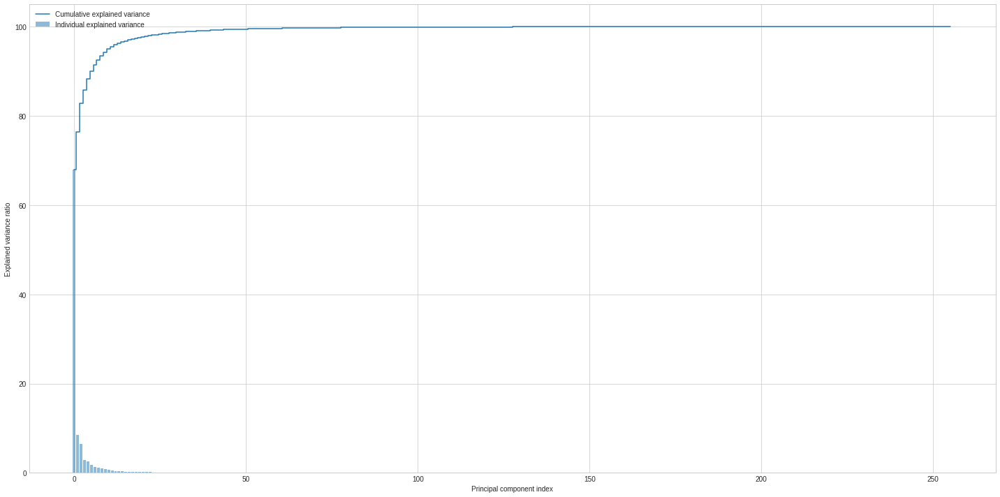

In [ ]:
#Operation for cumulative esplained variance 
CumExpVariance = np.cumsum(expVariance)
#Using seaborn-whitegrid to plot the diagram 
with plt.style.context('seaborn-whitegrid'):
  #Initialzing the image size
  plt.figure(figsize=(20,10))
  #Initializing the explained vairance bar, customizing and labeling it 
  plt.bar(range(0,len(expVariance)), expVariance, alpha=0.5, align='center', label='Individual explained variance')
  #Initializing the explained vairance step, customizing and labeling it 
  plt.step(range(0,len(CumExpVariance)), CumExpVariance, where='mid',label='Cumulative explained variance')
  #Labeling the y-axis
  plt.ylabel('Explained variance ratio')
  #Labeling the x-axis
  plt.xlabel('Principal component index')
  plt.legend(loc='best')
  plt.tight_layout()
  #Displays the diagram
  plt.show()

/usr/local/lib/python3.8/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)
/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.8/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)


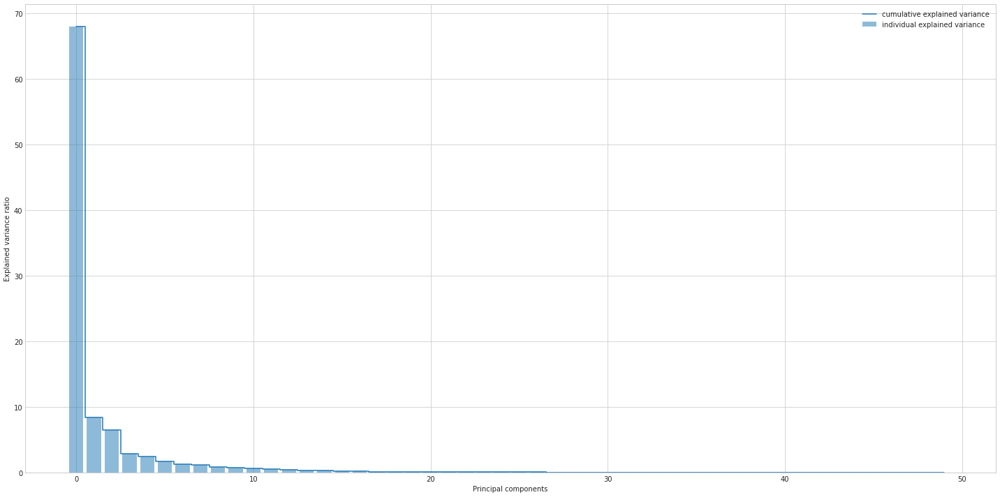

In [ ]:
#Using seaborn-whitegrid to plot the diagram 
with plt.style.context('seaborn-whitegrid'):
    #Initialzing the image size
    plt.figure(figsize=(20, 10))
    #Initializing the explained vairance bar, customizing and labeling it 
    plt.bar(range(50), expVariance[:50], alpha=0.5, align='center',label='individual explained variance')
    #Initializing the explained vairance step, customizing and labeling it 
    plt.step(range(50), expVariance[:50], where='mid',label='cumulative explained variance')
    #Labeling the y-axis
    plt.ylabel('Explained variance ratio')
    #Labeling the x-axis
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    #Customizing the layout
    plt.tight_layout()
    #Saving the figure
    plt.savefig('pca2.pdf')

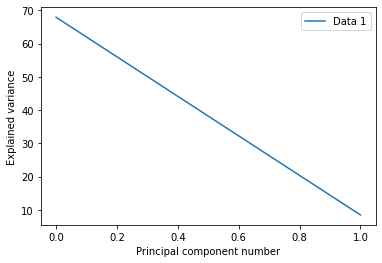

In [ ]:
#Expalined variance for principal component
exp_vA =expVariance[:2]
#Labeling the data 
plt.plot(exp_vA, label="Data 1")
plt.xlabel("Principal component number")
plt.ylabel("Explained variance")
plt.legend()
#Showing the data 
plt.show()

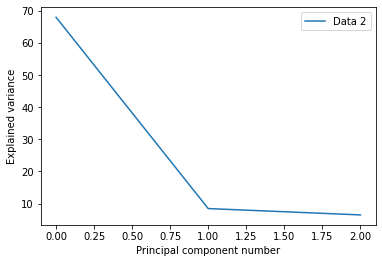

In [ ]:
#Expalined variance for principal component
exp_vA =expVariance[:3]
#Labeling the data 
plt.plot(exp_vA, label="Data 2")
plt.xlabel("Principal component number")
plt.ylabel("Explained variance")
plt.legend()
#Showing the data 
plt.show()

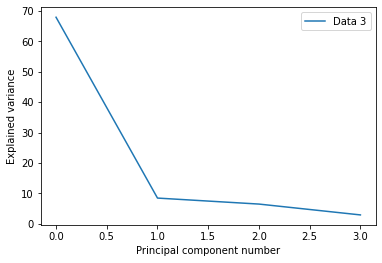

In [ ]:
exp_vA =expVariance[:4]
plt.plot(exp_vA, label="Data 3")
plt.xlabel("Principal component number")
plt.ylabel("Explained variance")
plt.legend()
plt.show()

## F. Reconstruction of the image
Reconstruct the image based on number of principal components you picked in step E.
Reconstruct all three images and conclude the result based on your observation. Display the reconstructed
image, experiment with various number of components.

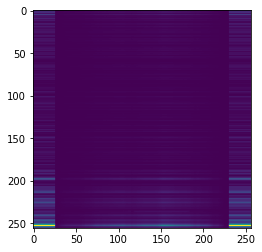

In [ ]:
#Taking the principal component in an array 
principal_components =[2, 3, 4]
#Projection of the image using its eigen vector 
projection=np.dot(ImageInArray.T,abs(eigenVector)[:principal_components[0]].T)
#Reconstruction of the image using its eigen vector 
reconstruction=np.dot(projection,abs(eigenVector)[:principal_components[0]])
#Setting the image size
left = 0
top = 85
right = 200
bottom = 200
#A variable to display the image from the array 
im1 = Image.fromarray(np.absolute(reconstruction)).crop((left, top, right, bottom))
#Showing the reconstruction of the image 
plt.imshow(reconstruction.T)

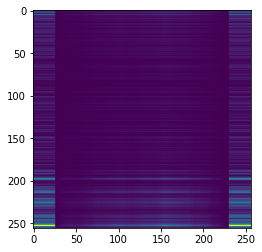

In [ ]:
#Projection of the image using its eigen vector 
projection=np.dot(ImageInArray.T,abs(eigenVector)[:principal_components[1]].T)
#Reconstruction of the image using its eigen vector 
reconstruction=np.dot(projection,abs(eigenVector)[:principal_components[1]])
#Setting the image size
left = 0
top = 85
right = 200
bottom = 200
#A variable to display the image from the array 
im1 = Image.fromarray(np.absolute(reconstruction)).crop((left, top, right, bottom))
#Showing the reconstruction of the image 
plt.imshow(reconstruction.T)

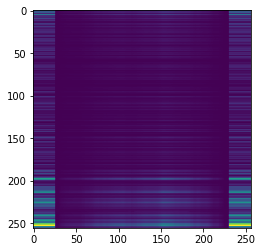

In [ ]:
#Projection of the image using its eigen vector 
projection=np.dot(ImageInArray.T,abs(eigenVector)[:principal_components[2]].T)
#Reconstruction of the image using its eigen vector 
reconstruction=np.dot(projection,abs(eigenVector)[:principal_components[2]])
#Setting the image size
left = 0
top = 85
right = 200
bottom = 200
#A variable to display the image from the array 
im1 = Image.fromarray(np.absolute(reconstruction)).crop((left, top, right, bottom))
#Showing the reconstruction of the image 
plt.imshow(reconstruction.T)